# Imports :

In [35]:
import warnings
warnings.filterwarnings('ignore')

import cv2
import numpy as np
import matplotlib.pyplot as plt
import skimage
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
from skimage.metrics import peak_signal_noise_ratio 
from skimage.metrics import mean_squared_error
from skimage.util import random_noise
from skimage import color, data, img_as_float
from scipy.spatial.distance import cdist
from numba import njit,prange
from skimage import data, img_as_float

# 2 Filtrage spatial d’une image : 

In [36]:
image = cv2.imread("Lena.png")
imGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# print(image.shape)
# print(imGray.shape)

## Le bruit gaussien :

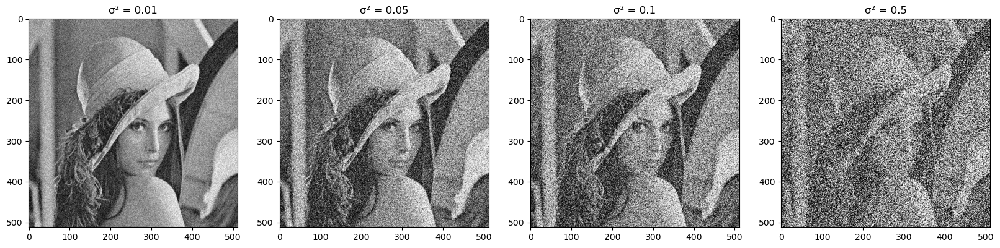

In [37]:
var_values = [0.01, 0.05, 0.1,0.5]

fig, axes = plt.subplots(1, len(var_values), figsize=(20, 10))

for i, var in enumerate(var_values):
    imGauss_var = random_noise(imGray, mode='gaussian', var=var)*255
    axes[i].imshow(imGauss_var, cmap='gray')
    axes[i].set_title(f'σ² = {var}')

plt.show()

### Interpretation : 

**En augmentant la variance sigma2 de 0.01 à 0.5, l'image se détériore progressivement, devenant de plus en plus bruitée et floue. 
À sigma2 = 0.5, le bruit est si prononcé que les détails sont presque entièrement occultés, illustrant l'impact négatif d'un bruit gaussien élevé sur la netteté visuelle d'une image.**

## Le bruit impulsionnel :

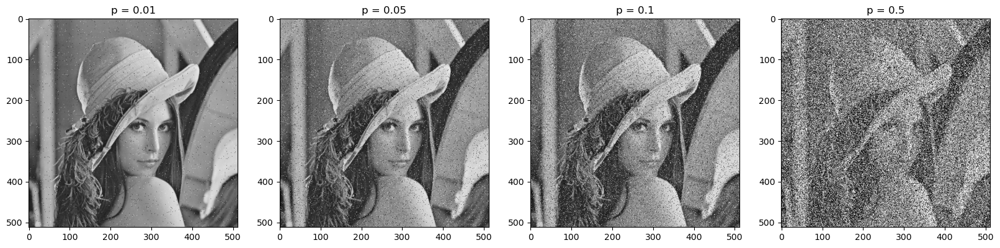

In [38]:
p_values = [0.01, 0.05, 0.1, 0.5]

fig, axes = plt.subplots(1, len(p_values), figsize=(20, 10))

for i, p in enumerate(p_values):
    imSP_var = random_noise(imGray, mode='s&p', amount=p)*255
    axes[i].imshow(imSP_var, cmap='gray')
    axes[i].set_title(f'p = {p}')

plt.show()

### Interpretation : 

**Lorsque p augmente de 0.01 à 0.5, le bruit&poivre s'intensifie, rendant l'image de moins en moins reconnaissable. Les détails s'estompent progressivement, et à p=0.5, l'image devient presque entièrement submergée par le bruit, mettant en évidence l'impact délétère d'un fort pourcentage de perturbation sur la qualité visuelle d'une image.**

## Le bruit qaussien VS le bruit impulsionnel :

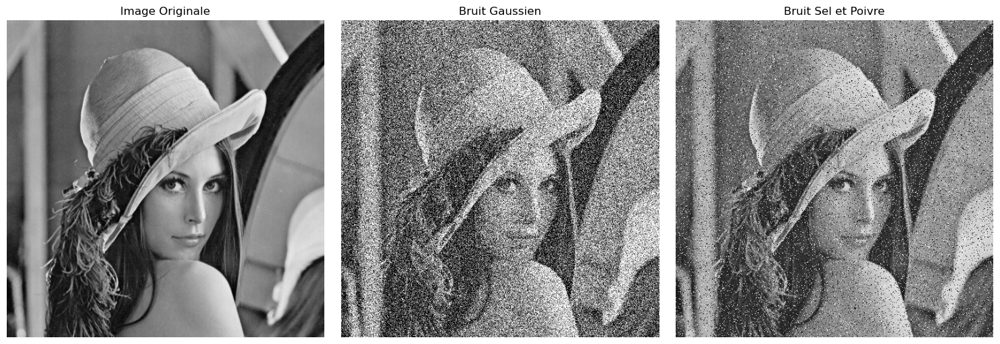

In [39]:
imGauss = random_noise(imGray, mode='gaussian', var=0.1)*255

imSP = random_noise(imGray, mode='s&p', amount=0.1)*255

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(imGray, cmap='gray')
axes[0].set_title('Image Originale')
axes[0].axis('off')

axes[1].imshow(imGauss, cmap='gray')
axes[1].set_title('Bruit Gaussien')
axes[1].axis('off')

axes[2].imshow(imSP, cmap='gray')
axes[2].set_title('Bruit Sel et Poivre')
axes[2].axis('off')

plt.tight_layout()
plt.show()


### Interpretation :

#### Bruit Gaussien
Le bruit introduit un effet de grain sur toute l’image, qui ressemble à un brouillard ou à un écran de télévision désaccordé. Cette perturbation, bien que répandue uniformément, conserve la cohérence globale des formes et des motifs de l’image originale, bien que ceux-ci soient moins nettes.

#### Bruit Sel et Poivre
Ce type de bruit crée un contraste élevé avec des pixels blancs et noirs aléatoires, simulant des erreurs de transmission ou des capteurs défectueux. Il a tendance à être plus distrayant que le bruit gaussien car il interrompt abruptement la continuité visuelle, rendant certaines régions de l'image difficiles à interpréter.

**Conclusion :**
Le bruit gaussien est plus subtil et plus répandu dans les images, simulant des perturbations naturelles et aléatoires. En revanche, le bruit sel et poivre perturbe de manière aléatoire et localisée, créant des perturbations extrêmes et moins fréquentes. Souvent utilisé pour tester la robustesse des algorithmes de traitement d'image face à des erreurs sévères, le bruit S&P peut être plus gênant pour l'œil humain et plus difficile à corriger sans techniques avancées de restauration d'image.


# Restauration de l’image en appliquant les filtres adequats:

**Fixons sigma2 à 0.005 et p à 0.05**

In [40]:
sigma2 = 0.005
p = 0.05

imGauss = random_noise(imGray, mode='gaussian', var=sigma2)*255
imSP = random_noise(imGray, mode='s&p', amount=p)*255

In [41]:
imGauss= np.uint8(imGauss)
imSP= np.uint8(imSP)

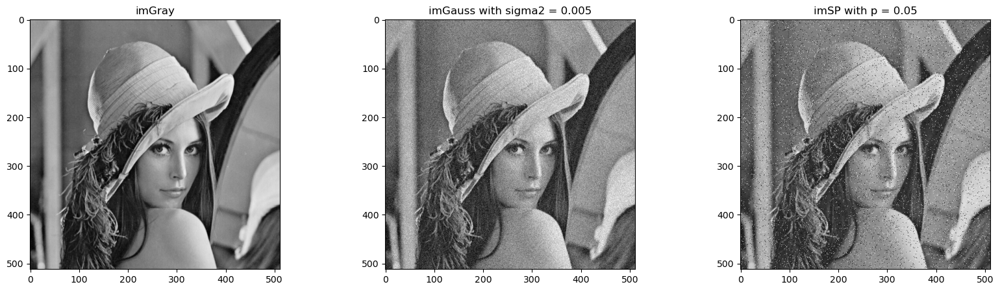

In [42]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

axes[0].imshow(imGray, cmap='gray')
axes[0].set_title('imGray')

axes[1].imshow(imGauss, cmap='gray')
axes[1].set_title('imGauss with sigma2 = 0.005')

axes[2].imshow(imSP, cmap='gray')
axes[2].set_title('imSP with p = 0.05')

plt.show()

**Testons plusiseurs valerus de kernel_size pour la filtre moyenne (3x3 ,5x5 et 7x7)  et plusieurs valeurs de sigma2 pour la filtre gausienne pour les deux types de bruits (gaussien et S&P)**

In [43]:
kernel_sizes = [3, 5, 7]
sigma_values = [0.5, 0.8, 5]

def apply_filters_and_plot(image, image_title):
    original_image = image.copy()
    
    plt.figure(figsize=(18, 5))
    for i, k in enumerate(kernel_sizes):
        filtered_image = cv2.blur(image, (k, k))
        mse = mean_squared_error(original_image, filtered_image)
        psnr = peak_signal_noise_ratio(original_image, filtered_image)
        
        plt.subplot(1, len(kernel_sizes), i + 1)
        plt.imshow(filtered_image, cmap='gray')
        plt.title(f'{image_title} - Blur k={k}\nMSE: {mse:.2f}, PSNR: {psnr:.2f} dB')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(18, 5))
    for i, sigma in enumerate(sigma_values):
        filtered_image = cv2.GaussianBlur(image, (kernel_sizes[1], kernel_sizes[1]), sigma)
        mse = mean_squared_error(original_image, filtered_image)
        psnr = peak_signal_noise_ratio(original_image, filtered_image)

        plt.subplot(1, len(sigma_values), i + 1)
        plt.imshow(filtered_image, cmap='gray')
        plt.title(f'{image_title} - Gaussian k={kernel_sizes[1]}, sigma={sigma}\nMSE: {mse:.2f}, PSNR: {psnr:.2f} dB')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


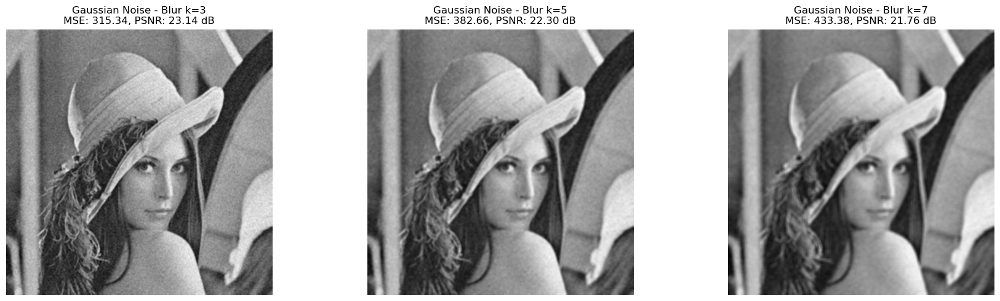

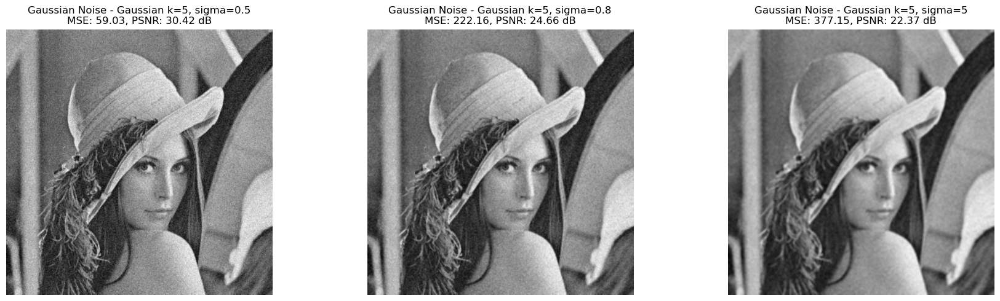

In [44]:
apply_filters_and_plot(imGauss, 'Gaussian Noise')

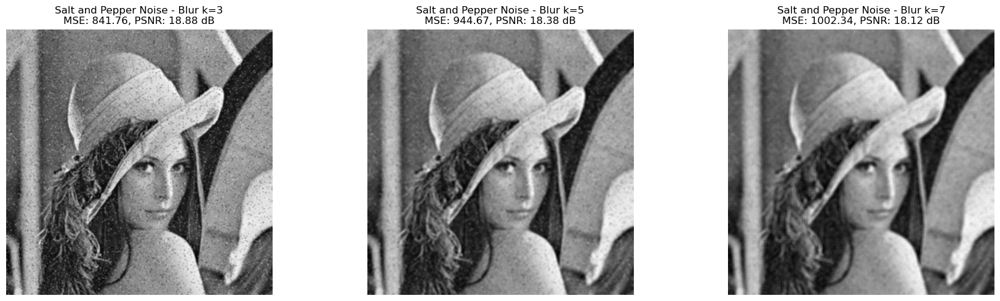

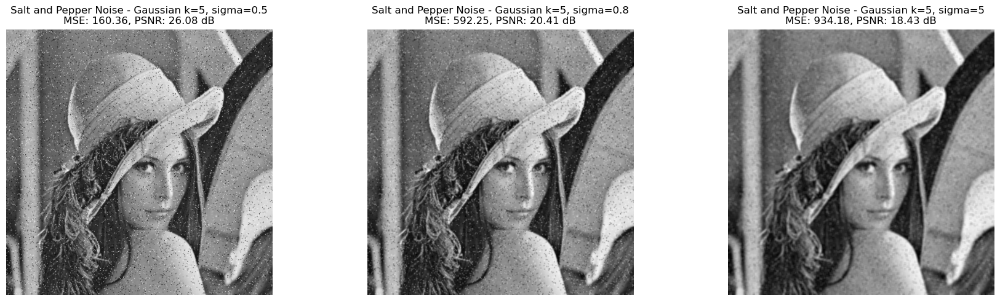

In [45]:
apply_filters_and_plot(imSP, 'Salt and Pepper Noise')

# Interpretation :

- Avec le filtre moyen (Blur), lorsque la taille du noyau k augmente, les images deviennent progressivement plus floues. Les détails et les textures de l'image originale commencent à disparaître, car le filtre moyen a tendance à "lisser" l'image en remplaçant chaque pixel par la moyenne de ses voisins. Plus le noyau est grand, plus l'effet de flou est prononcé, ce qui peut être bénéfique pour atténuer le bruit, mais au détriment de la perte de détails fins.

- Avec le filtre gaussien, l'augmentation de la valeur de l'écart-type siqma2 conduit également à une augmentation de l'effet de flou. Un sigma2  plus élevé signifie que le poids donné aux pixels voisins est plus réparti, ce qui lisse davantage l'image et atténue le bruit. Cependant, un sigma2 trop élevé peut rendre l'image trop floue et supprimer des informations importantes, tandis qu'un simga2 trop bas peut ne pas être suffisant pour réduire efficacement le bruit.

# Le filtre le plus efficace pour les bruits gaussien et sel et poivre :

**Appliquons les 3 filtres : le moyen (blur), le  gaussien (GaussianBlur) et le  médian (medianBlur) sur deux images : imGauss   et imSP**

In [46]:
NewImGausswithblur = cv2.blur(imGauss, (3,3))
NewImGausswithgauss = cv2.GaussianBlur(imGauss, (3,3) , 3)
NewImGausswithmedian = cv2.medianBlur(imGauss,3)

In [47]:
NewImSPwithblur = cv2.blur(imSP, (3,3))
NewImSPwithgauss = cv2.GaussianBlur(imSP, (3,3) , 3)
NewImSPwithmedian = cv2.medianBlur(imSP,3)

### Calcul de PSNR et MSE :

In [48]:
psnr_newimGausswithblur = psnr(imGray, NewImGausswithblur)
psnr_newimGausswithgauss = psnr(imGray, NewImGausswithgauss)
psnr_newimGausswithmedian = psnr(imGray, NewImGausswithmedian)

psnr_newimSPwithblur = psnr(imGray, NewImSPwithblur)
psnr_newimSPwithgauss = psnr(imGray, NewImSPwithgauss)
psnr_newimSPwithmedian = psnr(imGray, NewImSPwithmedian)

mse_newimGausswithblur = mse(imGray, NewImGausswithblur)
mse_newimGausswithgauss = mse(imGray, NewImGausswithgauss)
mse_newimGausswithmedian = mse(imGray, NewImGausswithmedian)

mse_newimSPwithblur = mse(imGray, NewImSPwithblur)
mse_newimSPwithgauss = mse(imGray, NewImSPwithgauss)
mse_newimSPwithmedian = mse(imGray, NewImSPwithmedian)

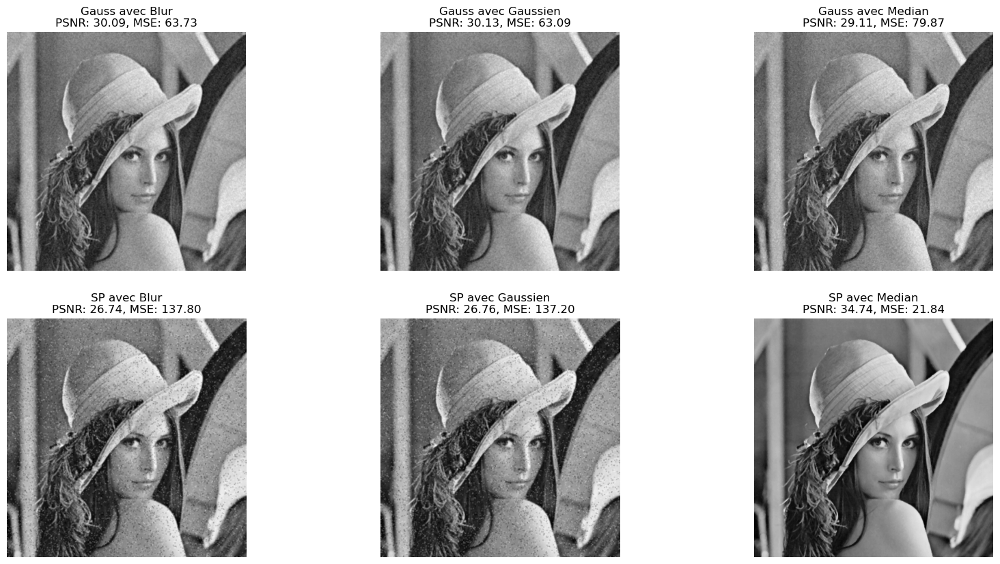

In [49]:
mse_newimGausswithblur = mse(imGray, NewImGausswithblur)
mse_newimGausswithgauss = mse(imGray, NewImGausswithgauss)
mse_newimGausswithmedian = mse(imGray, NewImGausswithmedian)

mse_newimSPwithblur = mse(imGray, NewImSPwithblur)
mse_newimSPwithgauss = mse(imGray, NewImSPwithgauss)
mse_newimSPwithmedian = mse(imGray, NewImSPwithmedian)

plt.figure(figsize=(20, 10))

plt.subplot(2, 3, 1)
plt.imshow(NewImGausswithblur, cmap='gray')
plt.title(f'Gauss avec Blur\nPSNR: {psnr_newimGausswithblur:.2f}, MSE: {mse_newimGausswithblur:.2f}')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(NewImGausswithgauss, cmap='gray')
plt.title(f'Gauss avec Gaussien\nPSNR: {psnr_newimGausswithgauss:.2f}, MSE: {mse_newimGausswithgauss:.2f}')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(NewImGausswithmedian, cmap='gray')
plt.title(f'Gauss avec Median\nPSNR: {psnr_newimGausswithmedian:.2f}, MSE: {mse_newimGausswithmedian:.2f}')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(NewImSPwithblur, cmap='gray')
plt.title(f'SP avec Blur\nPSNR: {psnr_newimSPwithblur:.2f}, MSE: {mse_newimSPwithblur:.2f}')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(NewImSPwithgauss, cmap='gray')
plt.title(f'SP avec Gaussien\nPSNR: {psnr_newimSPwithgauss:.2f}, MSE: {mse_newimSPwithgauss:.2f}')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(NewImSPwithmedian, cmap='gray')
plt.title(f'SP avec Median\nPSNR: {psnr_newimSPwithmedian:.2f}, MSE: {mse_newimSPwithmedian:.2f}')
plt.axis('off')

plt.show()

## Interprétation :

Dapres les valeurs de PSNR et MSE , nous constatons que : 
- le filtre gaussien offre les meilleurs résultats sur l'image corrompue par le bruit gaussien
- le filtre médian est le plus efficace pour l'image avec le bruit sel et poivre

Ces observations confirment que pour avoir une plus grande fidélité à l'image originale , le choix de la technique de filtrage doit être adapté à la nature spécifique du bruit présent dans l'image.

# No Local Means :

## Implementation :

In [50]:
def NLmeans(image, kernel_r=3, kernel_t=7, h=1.5,sigma=0.05):
    r=kernel_r
    t=(kernel_t-1)//2
    h=h
    var=sigma * sigma
    if r % 2 == 0:
        r+= 1  
        

    dtype = np.float32 if image.dtype == np.float32 else np.float64
    n_row, n_col = image.shape
    offset = r// 2
    
    #ajouter ke padding 
    padded = np.pad(image, ((offset, offset), (offset, offset)), mode='reflect')
    
    result = np.empty_like(image)
    A = (r - 1.) / 4.
    range_vals = np.arange(-offset, offset + 1, dtype=dtype)
    xg_row, xg_col = np.meshgrid(range_vals, range_vals, indexing='ij')
    w = np.exp(-(xg_row * xg_row + xg_col * xg_col) / (2 * A * A))
    w *= 1. / (np.sum(w) * h * h)
    var *= 2
    total_samples=n_row*n_col
    
    
    for row in range(n_row):
        i_start = row - min(t, row)
        i_end = row + min(t + 1, n_row - row)

        for col in range(n_col):
            new_value=0
            weight_sum = 0
            central_patch = padded[row:row+r, col:col+r]
            j_start = col - min(t, col)
            j_end = col + min(t + 1, n_col - col)

            for i in range(i_start, i_end):
                for j in range(j_start, j_end):
                    weight = patch_distance(central_patch, padded[i:i+r, j:j+r], w, r, var)
                    weight_sum += weight
                    new_value += weight * padded[i+offset, j+offset]
            result[row, col] = new_value / weight_sum
    return np.squeeze(result)

In [51]:
# @njit() pour accelerer le calcul de la distance :
@njit() 
def patch_distance(p1, p2, w, r, var):
    distance = 0
    for i in range(r):
        if distance>5.0:
            return 0
        for j in range(r):
                tmp_diff = p1[i, j] - p2[i, j,]
                distance += w[i, j] * (tmp_diff * tmp_diff )
    return np.exp(-max(0.0, distance-2*var))

## Choisir la meilleur combinaison de pararmetres : 

In [29]:
t_values = [3, 7]
r_values = [13, 21]
sigma_values = [0.01, 0.08]

best_psnr = -np.inf
best_mse = np.inf
best_params = {}

for t in t_values:
    for r in r_values:
        for sigma in sigma_values:
            h_factor = 1.15 * sigma
            total_psnr = 0
            total_mse = 0

            img = cv2.imread('canard.png')
            imgGray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            imGauss = skimage.util.random_noise(imgGray, mode="gaussian", var=sigma ** 2)

            denoised_nl = NLmeans(imGauss, t, r, sigma, h_factor)

            psnr = peak_signal_noise_ratio(imgGray, np.uint8(denoised_nl * 255))
            mse = mean_squared_error(imgGray, np.uint8(denoised_nl * 255))

            print(f"Combinaison de paramètres: t={t}, r={r}, sigma={sigma}, h_factor={h_factor:.2f} | PSNR: {psnr:.2f} | MSE: {mse:.2f}")
            print("-" * 90)

            if psnr > best_psnr:
                best_psnr = psnr
                best_mse = mse
                best_params = {'t': t, 'r': r, 'sigma': sigma, 'h_factor': h_factor}

print("Meilleurs paramètres:")
print(best_params)
print("Meilleur PSNR:", best_psnr)
print("MSE correspondant:", best_mse)

Combinaison de paramètres: t=3, r=13, sigma=0.01, h_factor=0.01 | PSNR: 41.79 | MSE: 4.31
------------------------------------------------------------------------------------------
Combinaison de paramètres: t=3, r=13, sigma=0.08, h_factor=0.09 | PSNR: 26.04 | MSE: 162.00
------------------------------------------------------------------------------------------
Combinaison de paramètres: t=3, r=21, sigma=0.01, h_factor=0.01 | PSNR: 41.74 | MSE: 4.35
------------------------------------------------------------------------------------------
Combinaison de paramètres: t=3, r=21, sigma=0.08, h_factor=0.09 | PSNR: 26.05 | MSE: 161.64
------------------------------------------------------------------------------------------
Combinaison de paramètres: t=7, r=13, sigma=0.01, h_factor=0.01 | PSNR: 43.16 | MSE: 3.14
------------------------------------------------------------------------------------------
Combinaison de paramètres: t=7, r=13, sigma=0.08, h_factor=0.09 | PSNR: 31.14 | MSE: 50.03



**D'apres les parmaetres qu'on a choisi la meilleur combinaison est :**
- t= 7 
- r= 13 
- h= 0.0115

**=> On continue notre analyse avec ces valeurs de parametres.** 

## NLmeans VS Filtre gaussien(linéaire) VS Filtre médian(non linéaire) :

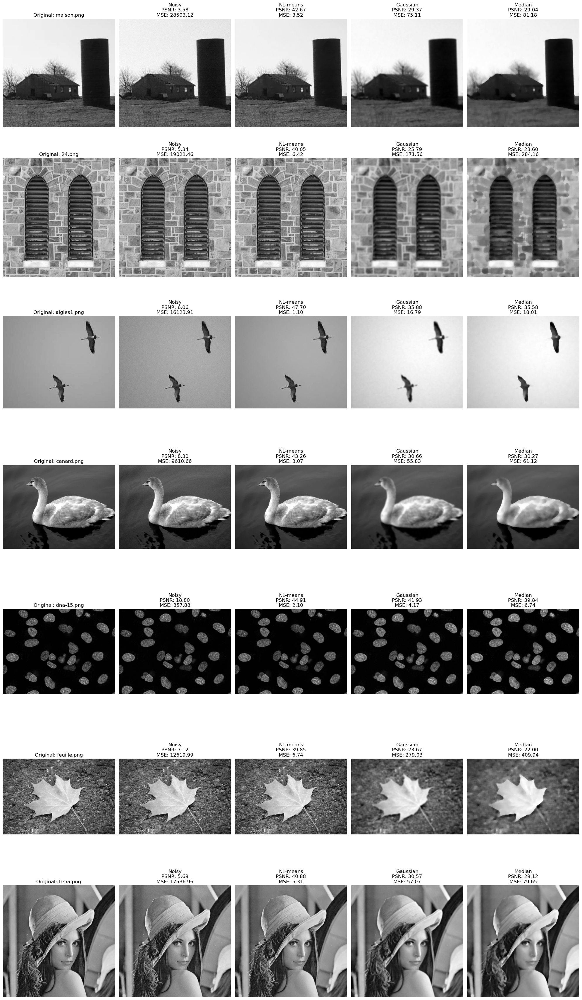

Moyennes des valeurs PSNR et MSE pour chaque méthode:
Nl - PSNR moyenne: 42.76, MSE moyenne: 4.04
Gauss - PSNR moyenne: 31.12, MSE moyenne: 94.22
Median - PSNR moyenne: 29.92, MSE moyenne: 134.40


In [52]:
images_paths = ["maison.png", "24.png", "aigles1.png", "canard.png", "dna-15.png", "feuille.png", "Lena.png"]

psnr_values = {'nl': [], 'gauss': [], 'median': []}
mse_values = {'nl': [], 'gauss': [], 'median': []}

fig, axs = plt.subplots(len(images_paths), 5, figsize=(20, 5 * len(images_paths)))

for i, path in enumerate(images_paths):
    sigma = 0.01
    img = cv2.imread(path)
    imgGray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    imGauss = skimage.util.random_noise(imgGray, mode="gaussian", var=sigma ** 2)

    restored_nl = NLmeans(imGauss, 7, 13, sigma, 1.15 * sigma)
    restored_gauss = cv2.GaussianBlur(imGauss, (7, 7), 0)
    restored_median = cv2.medianBlur(np.uint8(imGauss * 255), 7)

    mse_nl = mse(imgGray, np.uint8(restored_nl * 255))
    mse_gauss = mse(imgGray, np.uint8(restored_gauss * 255))
    mse_median = mse(imgGray, restored_median)

    psnr_nl = psnr(imgGray, np.uint8(restored_nl * 255))
    psnr_gauss = psnr(imgGray, np.uint8(restored_gauss * 255))
    psnr_median = psnr(imgGray, restored_median)

    psnr_values['nl'].append(psnr_nl)
    psnr_values['gauss'].append(psnr_gauss)
    psnr_values['median'].append(psnr_median)

    mse_values['nl'].append(mse_nl)
    mse_values['gauss'].append(mse_gauss)
    mse_values['median'].append(mse_median)

    # Original
    axs[i, 0].imshow(imgGray, cmap='gray')
    axs[i, 0].set_title(f'Original: {path}')
    axs[i, 0].axis('off')

    # Noisy
    axs[i, 1].imshow(np.uint8(imGauss * 255), cmap='gray')
    axs[i, 1].set_title(f'Noisy\nPSNR: {psnr(imgGray, imGauss):.2f}\nMSE: {mse(imgGray, imGauss):.2f}')
    axs[i, 1].axis('off')

    # NL-means
    axs[i, 2].imshow(np.uint8(restored_nl * 255), cmap='gray')
    axs[i, 2].set_title(f'NL-means\nPSNR: {psnr_nl:.2f}\nMSE: {mse_nl:.2f}')
    axs[i, 2].axis('off')

    # Gaussian
    axs[i, 3].imshow(restored_gauss, cmap='gray')
    axs[i, 3].set_title(f'Gaussian\nPSNR: {psnr_gauss:.2f}\nMSE: {mse_gauss:.2f}')
    axs[i, 3].axis('off')

    # Median
    axs[i, 4].imshow(restored_median, cmap='gray')
    axs[i, 4].set_title(f'Median\nPSNR: {psnr_median:.2f}\nMSE: {mse_median:.2f}')
    axs[i, 4].axis('off')

plt.tight_layout()
plt.show()

print("Moyennes des valeurs PSNR et MSE pour chaque méthode:")
for key in psnr_values.keys():
    avg_psnr = np.mean(psnr_values[key])
    avg_mse = np.mean(mse_values[key])
    print(f"{key.capitalize()} - PSNR moyenne: {avg_psnr:.2f}, MSE moyenne: {avg_mse:.2f}")

### Interprétation: 

#### Quantitativement : PSNR et MSE 

- NL-means présente la meilleure performance avec le PSNR moyen le plus élevé (42.74) et le MSE moyen le plus faible (4.04). Des valeurs de PSNR élevées et des valeurs de MSE faibles indiquent une meilleure qualité d'image après débruitage. Cela suggère que NL-means est très efficace pour réduire le bruit tout en préservant les détails importants de l'image.

- Filtre gaussien affiche un PSNR moyen de 31.13 et un MSE moyen de 94.24. Bien que cette méthode soit généralement rapide et simple à mettre en œuvre, elle est moins performante que NL-means selon vos résultats, ce qui peut être dû au fait que le flou gaussien a tendance à estomper l'image, réduisant ainsi les détails fins.

- Filtre médian montre le PSNR moyen le plus faible (29.92) et le MSE moyen le plus élevé (134.41) parmi les trois méthodes. Le filtre médian est souvent efficace pour éliminer le bruit "sel et poivre" mais peut ne pas être aussi efficace pour d'autres types de bruit ou peut entraîner la perte de certains détails de l'image.

**=> D'apres les métriques PSNR et MSE , NL-means surpasse le filtre gaussien et le filtre médian en termes de restauration de la qualité de l'image après le débruitage,pour l'ensemble d'images qu'on a testés.**

#### Qualitativement : visuellement 

- NL-means : semble fournir les résultats les plus propres, avec un bruit considérablement réduit tout en préservant les détails et les contours des images. Les textures sont plus lisses par rapport aux images bruitées sans paraître trop floues. Cela est corroboré par les scores PSNR élevés et les scores MSE faibles. Les détails fins, comme les textures des murs et les plumes des oiseaux, semblent bien conservés.

- Filtre gaussien : Les images traitées par le filtre gaussien montrent une réduction du bruit, mais elles paraissent plus floues que les images traitées avec NL-means. Cette méthode semble lisser l'ensemble de l'image, ce qui peut être bénéfique pour le bruit de fond mais au détriment de la netteté des détails, comme on peut le voir dans la perte de texture et de finesse des images.

- Filtre médian : Bien qu'elle réduise également le bruit, elle a tendance à rendre les images moins nettes . Les bords et les détails fins ne sont pas aussi bien conservés que dans NL-means, ce qui est particulièrement visible dans les images avec des détails fins comme les feuilles ou les structures complexes.

**=>En conclusion,  NL-means surpasse les autres méthodes en termes de conservation des détails et de réduction du bruit, tandis que le filtre gaussien et le filtre médian présentent des compromis plus importants entre la réduction du bruit et la préservation des détails. Cela est cohérent avec les scores PSNR et MSE affichés sur les images, où NL-means a constamment de meilleures performances.**